## Example 16 - Energy use in package

#### Create an environment named: "gdal"

Install Anaconda3-2020.07-Windows-x86_64.exe

In the Anaconda prompt execute the following commands:

    conda create --name gdal
    conda activate gdal

    conda config --add channels conda-forge 
    conda config --set channel_priority strict

    conda install gdal
    yes
    conda install geopandas
    yes
    conda install folium
    yes
    conda install pyyaml
    yes

    cd c:\Users\MRV\OneDrive - Van Oord\Software\github\OpenTNSim\
    pip install -e .

    conda install jupyter
    yes

    cd ..
    jupyter notebook

In [1]:
import opentnsim
print('This notebook has been tested with OpenTNSim version {} - branch: Afstuderen_LoesSegers'.format(opentnsim.__version__))

This notebook has been tested with OpenTNSim version 1.1.2 - branch: Afstuderen_LoesSegers


In [2]:
# package(s) related to time, space and id
import datetime, time
import platform
import random
import os
import pathlib
import io
import urllib
import tempfile
import functools
import logging
import pickle

# package(s) related to the simulation
import simpy
import networkx as nx  

# spatial libraries 
import shapely.geometry
import shapely.wkt
import pyproj
import shapely.geometry
from osgeo import ogr, osr
from simplekml import Kml, Style
import folium

# package(s) for data handling
import requests
import math             
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

logging.basicConfig(level=logging.INFO)
logger = logging.getLogger()

# define the coorinate system
geod = pyproj.Geod(ellps="WGS84")

In [3]:
# Link to the latest version of the 'Vaarweginformatie.nl' network
url = 'https://zenodo.org/record/3981105/files/network_digital_twin_v0.1.yaml'
url = 'https://zenodo.org/record/4578289/files/network_digital_twin_v0.2.pickle?download=1'


In [4]:
# Link to vessel database
src_dir = pathlib.Path(opentnsim.__file__).parent.parent

# Graph location
notebooks_path = src_dir / "notebooks"
location_vessel_database = notebooks_path / "Vessels" / "Vessel-database-2.csv"

## 0. Load useful methods

### A) Network functions
I think Fedor included working with the FIS in another version of OpenTNSim (for the P&W exercise) -- need to check

In [5]:
@functools.lru_cache
def load_fis_network(url):
    """load the topological fairway information system network (vaarweginformatie.nl)"""

    # get the data from the url
    resp = requests.get(url)
    # convert to file object
    stream = io.BytesIO(requests.get(url).content)
    
    G = nx.read_gpickle(stream)
    
    # some brief info
    n_bytes = len(resp.content)
    msg = '''Loaded network from {url} file size {mb:.2f}MB. Network has {n_nodes} nodes and {n_edges} edges.'''
    summary = msg.format(url=url, mb=n_bytes / 1000**2, n_edges=len(G.edges), n_nodes=len(G.nodes))
    logger.info(summary)

    # The topological network contains information about the original geometry. 
    # Let's convert those into python shapely objects for easier use later
    for n in G.nodes:
        G.nodes[n]['geometry'] = shapely.geometry.Point(G.nodes[n]['X'], G.nodes[n]['Y'])
    for e in G.edges:
        edge = G.edges[e]
        edge['geometry'] = shapely.wkt.loads(edge['Wkt'])
        edge['length'] = edge_length(edge)    
    
    return G 

In [6]:
def find_closest_node(G, point):
    """find the closest node on the graph from a given point"""
    
    distance = np.full((len(G.nodes)), fill_value=np.nan)
    for ii, n in enumerate(G.nodes):
        distance[ii] = point.distance(G.nodes[n]['geometry'])
    name_node = list(G.nodes)[np.argmin(distance)]
    distance_node = np.min(distance)
    
    return name_node, distance_node

In [7]:
def find_closest_edge(G, point):
    """find the closest edge on the graph from a given point"""
    
    distance = np.full((len(G.edges)), fill_value=np.nan)
    for ii, e in enumerate(G.edges):
        distance[ii] = point.distance(G.edges[e]['geometry'])
    name_edge = list(G.edges)[np.argmin(distance)]
    distance_edge = np.min(distance)
    
    return name_edge, distance_edge

In [8]:
def edge_length(edge):
    """compute the great circle length of an edge
    The network version 0.1 contains the lat/lon distance in a length property. 
    But we need the "great circle" or projected distance. 
    Let's define a function to recompute it.
    """
    
    # get the geometry
    geom = edge['geometry']
    # get lon, lat
    lats, lons = np.array(geom).T
    # this requires pyproj 2.3.0
    distance = geod.line_length(lons, lats)

    return distance

### B) Methods to calculate vessel properties
Moved to package

### C) Methods to calculate the resistance, power and corresponding emissions
Moved to package

### D) Calculate the energy use and emission per time step
Moved to package

### 1. Load Vaarweginformatie.nl graph

In [9]:
# create a cached version to speed up loading (remove cached file if a better yaml file is available)
fname = "fis_cache/{}.pkl".format('FIS')

if os.path.exists(fname):
    print('I am loading cached network')
    with open(fname, 'rb') as pkl_file:
        FG = pickle.load(pkl_file)
        pkl_file.close()

else:
    print('I am getting new network')
    FG = load_fis_network(url)

    os.makedirs(os.path.dirname(fname), exist_ok=True)
    with open(fname, 'wb') as pkl_file:
        pickle.dump(FG, pkl_file)
        pkl_file.close()

I am loading cached network


#### 1.1 Select only a relevant area (corridor Rotterdam-Antwerp)

In [10]:
#This polygon describes the area of the AIS data received from RWS

# North-East
NE = (3.90838623046875, 51.18278643144626)
# South-East
SE = (4.73236083984375, 51.18278643144626)
# South-West
SW = (4.73236083984375, 51.95611479866179)
# North-West
NW = (3.90838623046875, 51.95611479866179)

polygon = shapely.geometry.Polygon([NE, SE, SW, NW])

#### 1.2 Add the relevant information to the nodes and edges

In [11]:
nodes = []
edges = []

node_names = []

for edge in FG.edges(data = True):
    node_1 = FG.nodes[edge[0]]
    node_2 = FG.nodes[edge[1]]
    
    if node_1["geometry"].within(polygon) or node_2["geometry"].within(polygon):
        nodes.append(node_1)
        nodes.append(node_2)
        node_names.append(edge[0])
        node_names.append(edge[1])
        edges.append(edge)

In [12]:
FG = nx.DiGraph() #FG_new

for i in range(len(nodes)):
    node = nodes[i]
    node_name = node_names[i]
    FG.add_node(node_name, name = str((node['X'], node['Y'])), Position = (node['X'], node['Y']), geometry = node["geometry"])

for edge in edges:
    FG.add_edge(edge[0], edge[1], Info = edge[2]) 

In [13]:
# The read_shp creates a directed graph with single edges
# We require a directed graph but two-way traffic

FG = FG.to_undirected() 
FG = FG.to_directed() 

#### 1.3 Plot the entire network

In [14]:
# Plot the network and highlight the Volkerak locks
m = folium.Map(location=[51.7, 4.4], zoom_start = 12, tiles="cartodbpositron")

for edge in FG.edges(data = True):
    points_x = list(edge[2]["Info"]["geometry"].coords.xy[0])
    points_y = list(edge[2]["Info"]["geometry"].coords.xy[1])
    
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))
        
     
    
    if edge[2]["Info"]["StartJunctionId"] == 'L42863_A':
        folium.PolyLine(line, color = "red", weight = 5, popup = edge[2]["Info"]["StartJunctionId"]).add_to(m)
    
    #if edge[2]["Info"]["EndJunctionId"] == 'L42863_A':
        #folium.PolyLine(line, color = "red", weight = 5, popup = edge[2]["Info"]["StartJunctionId"]).add_to(m)
    
    else:
        folium.PolyLine(line, weight = 2, popup = edge[2]["Info"]["StartJunctionId"]).add_to(m)

m

In [15]:
# Plot the edges with an available GeneralDepth (draft limitation)

n = folium.Map(location=[51.55, 4.30], zoom_start = 11, tiles="cartodbpositron")

for edge in FG.edges(data = True):
    points_x = list(edge[2]["Info"]["geometry"].coords.xy[0])
    points_y = list(edge[2]["Info"]["geometry"].coords.xy[1])
    
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))
        
     
    
    if not np.isnan(edge[2]["Info"]["GeneralDepth"]):
        folium.PolyLine(line, color = "red", weight = 3, popup = edge[2]["Info"]["GeneralDepth"]).add_to(n)
    
    else:
        folium.PolyLine(line, weight = 2, popup = edge[2]["Info"]["GeneralDepth"]).add_to(n)

#n

In [16]:
# Plot the edges with an available SeaFairingDepth (draft limitation)

o = folium.Map(location=[51.55, 4.30], zoom_start = 11, tiles="cartodbpositron")

for edge in FG.edges(data = True):
    points_x = list(edge[2]["Info"]["geometry"].coords.xy[0])
    points_y = list(edge[2]["Info"]["geometry"].coords.xy[1])
    
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))
        
     
    
    if not np.isnan(edge[2]["Info"]["SeaFairingDepth"]):
        folium.PolyLine(line, color = "red", weight = 3, popup = edge[2]["Info"]["SeaFairingDepth"]).add_to(o)
    
    else:
        folium.PolyLine(line, weight = 2, popup = edge[2]["Info"]["SeaFairingDepth"]).add_to(o)

o

In [17]:
# We add the SeaFairingDepth to the GeneralDepth in case the GeneralDepth contains no information

for edge in FG.edges(data = True):
    if np.isnan(edge[2]["Info"]["GeneralDepth"]):
        if not np.isnan(edge[2]["Info"]["SeaFairingDepth"]):
            edge[2]["Info"]["GeneralDepth"] = edge[2]["Info"]["SeaFairingDepth"]

In [18]:
# Plot the edges of which information is available about limitations in draft (which we can relate to water depth)

n = folium.Map(location=[51.55, 4.30], zoom_start = 11, tiles="cartodbpositron")

for edge in FG.edges(data = True):
    points_x = list(edge[2]["Info"]["geometry"].coords.xy[0])
    points_y = list(edge[2]["Info"]["geometry"].coords.xy[1])
    
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))
        
     
    
    if not np.isnan(edge[2]["Info"]["GeneralDepth"]):
        folium.PolyLine(line, color = "red", weight = 1, popup = edge[2]["Info"]["GeneralDepth"]).add_to(n)
    
    else:
        folium.PolyLine(line, weight = 1, popup = edge[2]["Info"]["GeneralDepth"]).add_to(n)

n

In [19]:
# We assume that in case we have a draft limitation for the edge, that the water depth is the draft limitation + 1.5 meter
# We assume that in case no information is available, that we consider deep water: assumption is water depth = 15 meter

for edge in FG.edges(data = True):
    if not np.isnan(edge[2]["Info"]["GeneralDepth"]):
        edge[2]["Info"]["GeneralDepth"] = edge[2]["Info"]["GeneralDepth"] + 1.5
    else:
        edge[2]["Info"]["GeneralDepth"] = 15
        

In [20]:
#We plot the water depth for each edge, based on defined 'water depth ranges'

p = folium.Map(location=[51.55, 4.30], zoom_start = 11,  tiles="cartodbpositron")

for edge in FG.edges(data = True):
    points_x = list(edge[2]["Info"]["geometry"].coords.xy[0])
    points_y = list(edge[2]["Info"]["geometry"].coords.xy[1])
    
    line = []
    for i, _ in enumerate(points_x):
        line.append((points_y[i], points_x[i]))
        
     
    
    if edge[2]["Info"]["GeneralDepth"] <= 4.00:
        folium.PolyLine(line, color = "darkred", weight = 3, popup = edge[2]["Info"]["GeneralDepth"]).add_to(p)
        
    elif 4.00 < edge[2]["Info"]["GeneralDepth"] <= 6.00:
        folium.PolyLine(line, color = "red", weight = 3, popup = edge[2]["Info"]["GeneralDepth"]).add_to(p)
    
    elif 6.00 < edge[2]["Info"]["GeneralDepth"] <= 8.00:
        folium.PolyLine(line, color = "orange", weight = 3, popup = edge[2]["Info"]["GeneralDepth"]).add_to(p)
        
    elif 8.00 < edge[2]["Info"]["GeneralDepth"] <= 10.00:
        folium.PolyLine(line, color = "goldenrod", weight = 3, popup = edge[2]["Info"]["GeneralDepth"]).add_to(p)
    
    elif 10.00 < edge[2]["Info"]["GeneralDepth"] <= 12.00:
        folium.PolyLine(line, color = "gold", weight = 3, popup = edge[2]["Info"]["GeneralDepth"]).add_to(p)
        
    
    else:
        folium.PolyLine(line, weight = 1, popup = edge[2]["Info"]["GeneralDepth"]).add_to(p)
        

p

### 2. Prepare vessel objects

#### 2.1 Load vessel database

In [21]:
# use the 'Vessel database v2.ipynb' notebook to generate 'Vessel-database-2.csv'
# for every value add a traceable source

vessel_db = pd.read_csv(location_vessel_database)
vessel_db.head()

,VesselID,B,L,H_e,H_f,T_e,T_f,emissionfactor,P_installed,L_w,...,capacity_loaded,capacity_unloaded,speed_loaded,speed_unloaded,resistance_loaded,resistance_unloaded,is_loaded,avv_class,cemt_class,type
0,29a24858-4a51-11e9-9792-b469212bff5b,5.05,38.5,2.0,5.25,1.2,2.5,0.73,175.0,1.0,...,260.0,0.0,3.083,4.470,16919.0,9188.0,0.0,M1,I,Spits
1,dcc05ff4-4972-11e9-a543-b469212bff5b,6.60,52.5,2.0,6.10,1.4,2.6,0.72,250.0,1.0,...,422.5,0.0,3.361,4.638,28770.0,17524.0,0.0,M2,II,Kempenaar
2,e6cea50a-4972-11e9-a1f1-b469212bff5b,7.20,62.5,2.0,6.40,1.5,2.6,0.72,435.0,1.0,...,520.0,0.0,3.861,4.638,43935.0,22746.0,0.0,M3,III,Hagenaar
3,f0eb9740-4972-11e9-96ab-b469212bff5b,8.20,67.0,2.0,6.60,1.5,2.7,0.72,435.0,1.0,...,682.5,0.0,4.000,4.889,50582.0,28777.0,0.0,M4,III,Dortmund-Eems (L <= 74 m)
4,f5685128-4972-11e9-9bc8-b469212bff5b,8.20,82.5,2.0,6.40,1.5,2.7,0.72,435.0,2.0,...,812.5,0.0,3.916,5.027,54096.0,31794.0,0.0,M5,III,Verl. Dortmund (L > 74 m)


In [22]:
# renaming some of the vessel_db fields to align them with the code (NB: this alignment should be improved)
# in the end vessel_db should hold all (and not more than) the fields required by Vessel (see further down) 

# rename fields
vessel_db = vessel_db.rename(columns={
                                      'capacity_loaded': 'capacity'}
                                     )

# remove parameters that are not used (later we may want to add these via a mix-in)
del vessel_db['VesselID']
del vessel_db['own_weight']
del vessel_db['capacity_unloaded']
del vessel_db['speed_loaded']
del vessel_db['speed_unloaded']
del vessel_db['is_loaded']
del vessel_db['avv_class']
del vessel_db['cemt_class']
del vessel_db['resistance_loaded']
del vessel_db['resistance_unloaded']
del vessel_db['emissionfactor']

In [23]:
# add fields that are necessary for the energy calculation
vessel_db['C_b'] = 0.85

In [24]:
# This information from the table is needed as input

vessel_db.head()

,B,L,H_e,H_f,T_e,T_f,P_installed,L_w,capacity,type,C_b
0,5.05,38.5,2.0,5.25,1.2,2.5,175.0,1.0,260.0,Spits,0.85
1,6.60,52.5,2.0,6.10,1.4,2.6,250.0,1.0,422.5,Kempenaar,0.85
2,7.20,62.5,2.0,6.40,1.5,2.6,435.0,1.0,520.0,Hagenaar,0.85
3,8.20,67.0,2.0,6.60,1.5,2.7,435.0,1.0,682.5,Dortmund-Eems (L <= 74 m),0.85
4,8.20,82.5,2.0,6.40,1.5,2.7,435.0,2.0,812.5,Verl. Dortmund (L > 74 m),0.85


#### 2.2 Create a vessel object with the new mixins, and use this in the vessel generator

In [25]:
# Make a class out of mix-ins
TransportResource = type(
    'TransportResource', 
    (
        opentnsim.core.Identifiable, 
        opentnsim.core.ContainerDependentMovable, 
        opentnsim.core.HasResource, 
        opentnsim.core.Routeable, 
        opentnsim.core.VesselProperties, 
        opentnsim.energy.ConsumesEnergy,
        opentnsim.core.ExtraMetadata
    ), 
    {}
)

# For testing purposes: default v =  3 m/s
def compute_v_provider(v_empty, v_full):
    return lambda x: 3

# identify which vessel type to extract from the vessel database (change the name to change the vessel used)
vessel_type = 'Dortmund-Eems (L <= 74 m)' # <==============

# prepare data for the vessel
data_vessel = {"env": None,
               "name": "Vessel number 1",
               "route": None,
               "geometry": None,  # lon, lat
               "capacity": vessel_db[vessel_db['type']==vessel_type]['capacity'].values[0],
               "compute_v": compute_v_provider(v_empty=1, v_full=1),
               "v": 1,
               "type": vessel_db[vessel_db['type']==vessel_type]['type'].values[0],
               "B": vessel_db[vessel_db['type']==vessel_type]['B'].values[0],
               "L": vessel_db[vessel_db['type']==vessel_type]['L'].values[0],
               "H_e": vessel_db[vessel_db['type']==vessel_type]['H_e'].values[0],
               "H_f": vessel_db[vessel_db['type']==vessel_type]['H_f'].values[0],
               "T_e": vessel_db[vessel_db['type']==vessel_type]['T_e'].values[0],
               "T_f": vessel_db[vessel_db['type']==vessel_type]['T_f'].values[0],
               "P_installed": vessel_db[vessel_db['type']==vessel_type]['P_installed'].values[0],
               "L_w": vessel_db[vessel_db['type']==vessel_type]['L_w'].values[0],
               "C_B": vessel_db[vessel_db['type']==vessel_type]['C_b'].values[0],
               # added later (engine always at full power, 10 years old)
               'P_given': vessel_db[vessel_db['type']==vessel_type]['P_installed'].values[0], 
               'current_year': 2020,
               'C_year': 2010
              }

print(data_vessel)

# create the transport processing resource
vessels = []
vessel = TransportResource(**data_vessel)
print('arguments not used:')
print(vessel.metadata)

{'env': None, 'name': 'Vessel number 1', 'route': None, 'geometry': None, 'capacity': 682.5, 'compute_v': <function compute_v_provider.<locals>.<lambda> at 0x29d2b5160>, 'v': 1, 'type': 'Dortmund-Eems (L <= 74 m)', 'B': 8.2, 'L': 67.0, 'H_e': 2.0, 'H_f': 6.6, 'T_e': 1.5, 'T_f': 2.7, 'P_installed': 435.0, 'L_w': 1.0, 'C_B': 0.85, 'P_given': 435.0, 'current_year': 2020, 'C_year': 2010}
arguments not used:
{'P_given': 435.0}


# 3. Create environment

In [26]:
# Start simpy environment (at a given date and time) (simulation_start = datetime.datetime.now() to just start now)
simulation_start = datetime.datetime(2020, 9, 26) # <============ start time
env = simpy.Environment(initial_time = time.mktime(simulation_start.timetuple()))
env.epoch = time.mktime(simulation_start.timetuple())

# Add graph to environment
env.FG = FG 

# 4. Create locks on the edges

In [27]:
class IsLock(opentnsim.core.HasResource, opentnsim.core.Identifiable, opentnsim.core.Log):
    """Mixin class: Something has lock object properties
    properties in meters
    operation in seconds
    """

    def __init__(
        self,
        node_1,
        node_2,
        lock_length,
        lock_width,
        lock_depth,
        doors_open,
        doors_close,
        operating_time,
        waiting_area=True,
        *args,
        **kwargs
    ):
        super().__init__(*args, **kwargs)
        """Initialization"""

        # Properties
        self.lock_length = lock_length
        self.lock_width = lock_width
        self.lock_depth = lock_depth

        # Operating
        self.doors_open = doors_open
        self.doors_close = doors_close
        self.operating_time = operating_time

        # Water level
        assert node_1 != node_2

        self.node_1 = node_1
        self.node_2 = node_2
        self.water_level = random.choice([node_1, node_2])

        # Lay-Out
        self.line_up_area = {
            node_1: simpy.Resource(self.env, capacity=1),
            node_2: simpy.Resource(self.env, capacity=1),
        }

        waiting_area_resources = 1 if waiting_area else 100
        self.waiting_area = {
            node_1: simpy.Resource(self.env, capacity=waiting_area_resources),
            node_2: simpy.Resource(self.env, capacity=waiting_area_resources),
        }

    def convert_chamber(self, environment, new_level):
        """ Convert the water level """

        # Close the doors
        self.log_entry("Lock doors closing start", environment.now, self.water_level, 0)
        yield environment.timeout(self.doors_close)
        self.log_entry("Lock doors closing stop", environment.now, self.water_level, 0)

        # Convert the chamber
        self.log_entry(
            "Lock chamber converting start", environment.now, self.water_level, 0
        )

        # Water level will shift
        self.change_water_level(new_level)

        yield environment.timeout(self.operating_time)
        self.log_entry(
            "Lock chamber converting stop", environment.now, self.water_level, 0
        )

        # Open the doors
        self.log_entry("Lock doors opening start", environment.now, self.water_level, 0)
        yield environment.timeout(self.doors_open)
        self.log_entry("Lock doors opening stop", environment.now, self.water_level, 0)

    def change_water_level(self, side):
        """ Change water level and priorities in queue """

        self.water_level = side

        for request in self.resource.queue:
            request.priority = -1 if request.priority == 0 else 0

            if request.priority == -1:
                self.resource.queue.insert(
                    0, self.resource.queue.pop(self.resource.queue.index(request))
                )
            else:
                self.resource.queue.insert(
                    -1, self.resource.queue.pop(self.resource.queue.index(request))
                )


#### Rozenburgse lock

In [28]:
rozenburgse_lock = IsLock(env = env, nr_resources = 1, priority = True, name = "Rozenburgse lock", 
                        node_1 = "B7951_B", node_2 = "L4199_A",
                        lock_length = 300, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)

In [29]:
for edge in FG.edges(data = True):
    if edge[2]["Info"]["StartJunctionId"] == 'B7951_B':
        # For testing, all locks have the water level at the right side
        rozenburgse_lock.water_level = "B7951_B"
        # Add locks to the correct edge
        FG.edges[edge[0], edge[1]]["Lock"] = [rozenburgse_lock]

#### Volkerak locks (1, 2 and 3)

In [30]:
volkerak_lock_nr_1 = IsLock(env = env, nr_resources = 1, priority = True, name = "Volkerak - 1", 
                        node_1 = "L42863_A", node_2 = "L42863_B",
                        lock_length = 330, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)

volkerak_lock_nr_2 = IsLock(env = env, nr_resources = 1, priority = True, name = "Volkerak - 2", 
                        node_1 = "L42863_A", node_2 = "L42863_B",
                        lock_length = 330, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)

volkerak_lock_nr_3 = IsLock(env = env, nr_resources = 1, priority = True, name = "Volkerak - 3", 
                        node_1 = "L42863_A", node_2 = "L42863_B",
                        lock_length = 330, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)

In [31]:
for edge in FG.edges(data = True): #FG_new
    if edge[2]['Info']['StartJunctionId'] == 'L42863_A':
        # For testing, all locks have the water level at the right side
        volkerak_lock_nr_1.water_level = "L42863_A"
        volkerak_lock_nr_2.water_level = "L42863_A"
        volkerak_lock_nr_3.water_level = "L42863_A"
        
        # Add locks to the correct edge
        FG.edges[edge[0], edge[1]]["Lock"] = [volkerak_lock_nr_1, volkerak_lock_nr_2, volkerak_lock_nr_3] #FG_new

#### Krammer locks (1 and 2)

In [32]:
krammer_lock_nr_1 = IsLock(env = env, nr_resources = 1, priority = True, name = "Krammer lock - 1", 
                        node_1 = "L39446_A", node_2 = "L39446_B",
                        lock_length = 280, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)

krammer_lock_nr_2 = IsLock(env = env, nr_resources = 1, priority = True, name = "Krammer lock - 2", 
                        node_1 = "L39446_A", node_2 = "L39446_B",
                        lock_length = 280, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)

In [33]:
for edge in FG.edges(data = True):
    if edge[2]['Info']["StartJunctionId"] == 'L39446_A':
        # For testing, all locks have the water level at the right side
        krammer_lock_nr_1.water_level = "L39446_A"
        krammer_lock_nr_2.water_level = "L39446_A"
        
        # Add locks to the correct edge
        FG.edges[edge[0], edge[1]]["Lock"] = [krammer_lock_nr_1, krammer_lock_nr_2]

#### Hansweert locks (1 and 2)

In [34]:
hansweert_lock_nr_1 = IsLock(env = env, nr_resources = 1, priority = True, name = "Hansweert lock - 1", 
                        node_1 = "L25235_A", node_2 = "L25235_B",
                        lock_length = 280, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)

hansweert_lock_nr_2 = IsLock(env = env, nr_resources = 1, priority = True, name = "Hansweert lock - 2", 
                        node_1 = "L25235_A", node_2 = "L25235_B",
                        lock_length = 280, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)

In [35]:
for edge in FG.edges(data = True):
    if edge[2]['Info']["StartJunctionId"] == 'L25235_A':
        # For testing, all locks have the water level at the right side
        hansweert_lock_nr_1.water_level = "L25235_A"
        hansweert_lock_nr_2.water_level = "L25235_A"
        
        # Add locks to the correct edge
        FG.edges[edge[0], edge[1]]["Lock"] = [hansweert_lock_nr_1, hansweert_lock_nr_2]

#### Kreekrak locks (1 and 2)

In [36]:
kreekrak_lock_nr_1 = IsLock(env = env, nr_resources = 1, priority = True, name = "Kreekrak lock - 1", 
                        node_1 = "L9305_A", node_2 = "L9305_B",
                        lock_length = 320, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)

kreekrak_lock_nr_2 = IsLock(env = env, nr_resources = 1, priority = True, name = "Kreekrak lock - 2", 
                        node_1 = "L9305_A", node_2 = "L9305_B",
                        lock_length = 320, lock_width = 24, lock_depth = 4.5, 
                        doors_open = 10 * 60, doors_close = 10 * 60, operating_time = 25 * 60)



In [37]:
for edge in FG.edges(data = True):
    if edge[2]['Info']["StartJunctionId"] == 'L9305_A':
        # For testing, all locks have the water level at the right side
        kreekrak_lock_nr_1.water_level = "L9305_A"
        kreekrak_lock_nr_2.water_level = "L9305_A"
        
        # Add locks to the correct edge
        FG.edges[edge[0], edge[1]]["Lock"] = [kreekrak_lock_nr_1, kreekrak_lock_nr_2]

# 4. Run simulation

In [38]:

# create a library of some interesting locations (lon, lat)
locations = {
    'Transferium Maasvlakte': shapely.geometry.Point(4.087406, 51.936737),
    'Neusse': shapely.geometry.Point(6.708892, 51.215737),
    'Basel': shapely.geometry.Point(7.640572, 47.555449),
    'Volkerak locks':  shapely.geometry.Point(4.408202, 51.689836),
    'Before volkerak': shapely.geometry.Point(4.430289, 51.700046),
    'After volkerak': shapely.geometry.Point(4.392555, 51.681250),
    'Kreekrak locks':  shapely.geometry.Point(4.230610, 51.447945),
    'Hansweert locks': shapely.geometry.Point(4.008972, 51.458791),
    'Schelde-Rijn canal-1': shapely.geometry.Point(4.201416987493968, 51.58410292465058), 
    'Schelde-Rijn canal-2': shapely.geometry.Point( 4.22456143757696, 51.5221824639149),
    'Maassluis': shapely.geometry.Point(4.22590208053588, 51.9284782409667),
    'Antwerpen': shapely.geometry.Point(4.291013, 51.373772),
    'Before Kreekrak': shapely.geometry.Point(4.220, 51.50),
    'After Kreekrak': shapely.geometry.Point(4.233996, 51.429589)
}

locations_nodes = {n: find_closest_node(FG, locations[n])[0] for n in locations} #FG_new


# Add environment, route/path and startlocation to the vessel
#start_point = locations_nodes['Before volkerak'] # <============== start point
#end_point = locations_nodes['Schelde-Rijn canal-1']   # <============== end point
start_point = locations_nodes['Maassluis'] # <============== start point
end_point = locations_nodes['Antwerpen']   # <============== end point

In [39]:
path = nx.dijkstra_path(FG, start_point, end_point, weight='length') # NB: dijkstra based on shortest route #FG_new
print('The path is', path)

vessel.env = env
vessel.route = path
vessel.geometry = FG.nodes[start_point]['geometry'] # <========== vessel start point #FG_new

route = nx.DiGraph(FG.subgraph(path)) #FG_new

print('')
print('The edges on the route', route.edges)

The path is ['8867449', 'B5729_B', 'B5729_A', '8860614', 'B57361_B', 'B57361_A', '8867741', 'B27780191_B', 'B27780191_A', 'L4199_A', 'B7951_B', 'B7951_A', '8866992', '8867008', '8861414', '8867154', '8867029', 'B23888_B', 'B23888_A', 'L6951_B', 'L6951_A', '8863200', '8865803', '8862143', 'B42792_B', 'B42792_A', '8867784', '8864737', 'S22992990_B', 'S22992990_A', '28313659', '8862371', '8862201', '8860968', '8867893', '8863432', 'B35761_B', 'B35761_A', '8862724', '8860870', '8860743', '8862498', 'L42863_A', 'L42863_B', 'B34113_A', 'B34113_B', '8868426', '8866727', '8865019', '8864258', '8864774', '8867060', '8865797', '8862801', '8864138', 'B30667_A', 'B30667_B', 'B37463_A', 'B37463_B', 'B9108_A', 'B9108_B', '8867083', '8868133', '8866632', '8868095', '8865574', '8868181', '8861380', 'B43908_A', 'B43908_B', 'L9305_A', 'L9305_B', 'B30870_A', 'B30870_B', '8867425', 'B20349_A', 'B20349_B', 'B18485_A', 'B18485_B', 'B41640_A', 'B41640_B', 'B25636_A', 'B25636_B', 'B22796_A', 'B22796_B', '2819

In [40]:
def start(env, vessel):
    """The start process moves a vessel over the network 
    (from its 'vessel.geometry' position to the end of 'vessel.route')"""
    vessel.log_entry("Start sailing", env.now, "", vessel.geometry)
    yield from vessel.move()
    vessel.log_entry("Stop sailing", env.now, "", vessel.geometry)
        
env.process(start(env, vessel))
env.run()

### 6. Calculate energy use

In [41]:
# create an EnergyCalculation object (vessel is used to initialise)
energycalculation = opentnsim.energy.EnergyCalculation(FG, vessel)

In [42]:
# apply EnergyCalculation method to post process vessel.log
energycalculation.calculate_energy_consumption()

# for now intermediate output is generated to show that the results are logical

In [43]:
#pd.read_excel (r'Correctionfactors.xlsx')

### 7. Results simulation

In [44]:
df = pd.DataFrame.from_dict(energycalculation.energy_use)
df.head(10)

/Users/baart_f/.virtualenvs/opentnsim/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



,time_start,time_stop,edge_start,edge_stop,P_tot,P_installed,total_energy,total_fuel_consumption,total_emission_CO2,total_emission_PM10,total_emission_NOX,stationary,water depth,distance,delta_t
0,2020-09-26 00:00:00.000000,2020-09-26 00:14:17.582465,POINT (4.212628022175 51.9226966401015),POINT (4.226963911609516 51.90134141645522),113.230719,435.0,26.973522,6073.788682,19284.279064,5.997614,216.358897,0,15.0,2572.747395,857.582465
1,2020-09-26 00:14:17.582465,2020-09-26 00:14:21.201592,POINT (4.226963911609516 51.90134141645522),POINT (4.226991737128698 51.90124536573693),113.230720,435.0,0.113832,25.632302,81.382559,0.025311,0.913067,0,15.0,10.857381,3.619127
2,2020-09-26 00:14:21.201592,2020-09-26 00:17:19.350146,POINT (4.226991737128698 51.90124536573693),POINT (4.22988664159343 51.8967883701162),113.230718,435.0,5.603302,1261.728997,4005.989566,1.245905,44.944977,0,15.0,534.445660,178.148554
3,2020-09-26 00:17:19.350146,2020-09-26 00:18:56.705532,POINT (4.22988664159343 51.8967883701162),POINT (4.228333485970047 51.89434562040169),113.230719,435.0,3.062117,689.515082,2189.210385,0.680868,24.561724,0,15.0,292.066158,97.355386
4,2020-09-26 00:18:56.705532,2020-09-26 00:19:00.322970,POINT (4.228333485970047 51.89434562040169),POINT (4.228361571014439 51.894249645247186),113.230715,435.0,0.113779,25.620339,81.344576,0.025299,0.912641,0,15.0,10.852314,3.617438
5,2020-09-26 00:19:00.322970,2020-09-26 00:19:43.904095,POINT (4.228361571014439 51.894249645247186),POINT (4.22869992579121 51.8930933838746),113.230717,435.0,1.370756,308.661326,979.999711,0.304790,10.995052,0,15.0,130.743374,43.581125
6,2020-09-26 00:19:43.904095,2020-09-26 00:20:18.717303,POINT (4.22869992579121 51.8930933838746),POINT (4.228967230551658 51.8921694150771),113.230720,435.0,1.094979,246.562961,782.837401,0.243471,8.783001,0,15.0,104.439625,34.813208
7,2020-09-26 00:20:18.717303,2020-09-26 00:20:22.336676,POINT (4.228967230551658 51.8921694150771),POINT (4.228995021021007 51.89207335421195),113.230725,435.0,0.113840,25.634045,81.388094,0.025313,0.913129,0,15.0,10.858119,3.619373
8,2020-09-26 00:20:22.336676,2020-09-26 00:20:43.276572,POINT (4.228995021021007 51.89207335421195),POINT (4.2291558028585285 51.891517593810136),113.230727,435.0,0.658622,148.305867,470.871129,0.146446,5.282912,0,15.0,62.819690,20.939896
9,2020-09-26 00:20:43.276572,2020-09-26 00:20:57.754071,POINT (4.2291558028585285 51.891517593810136),POINT (4.2292669647359284 51.891133350349534),113.230706,435.0,0.455360,102.536216,325.552484,0.101250,3.652518,0,15.0,43.432495,14.477499


In [45]:
df['CO2_g_m'] = df['total_emission_CO2'] / df['distance']
df['PM10_g_m'] = df['total_emission_PM10'] / df['distance']
df['NOX_g_m'] = df['total_emission_NOX'] / df['distance']

In [46]:
df.head(20)

,time_start,time_stop,edge_start,edge_stop,P_tot,P_installed,total_energy,total_fuel_consumption,total_emission_CO2,total_emission_PM10,total_emission_NOX,stationary,water depth,distance,delta_t,CO2_g_m,PM10_g_m,NOX_g_m
0,2020-09-26 00:00:00.000000,2020-09-26 00:14:17.582465,POINT (4.212628022175 51.9226966401015),POINT (4.226963911609516 51.90134141645522),113.230719,435.0,26.973522,6073.788682,19284.279064,5.997614,216.358897,0,15.0,2572.747395,857.582465,7.495598,0.002331,0.084096
1,2020-09-26 00:14:17.582465,2020-09-26 00:14:21.201592,POINT (4.226963911609516 51.90134141645522),POINT (4.226991737128698 51.90124536573693),113.230720,435.0,0.113832,25.632302,81.382559,0.025311,0.913067,0,15.0,10.857381,3.619127,7.495598,0.002331,0.084096
2,2020-09-26 00:14:21.201592,2020-09-26 00:17:19.350146,POINT (4.226991737128698 51.90124536573693),POINT (4.22988664159343 51.8967883701162),113.230718,435.0,5.603302,1261.728997,4005.989566,1.245905,44.944977,0,15.0,534.445660,178.148554,7.495598,0.002331,0.084096
3,2020-09-26 00:17:19.350146,2020-09-26 00:18:56.705532,POINT (4.22988664159343 51.8967883701162),POINT (4.228333485970047 51.89434562040169),113.230719,435.0,3.062117,689.515082,2189.210385,0.680868,24.561724,0,15.0,292.066158,97.355386,7.495598,0.002331,0.084096
4,2020-09-26 00:18:56.705532,2020-09-26 00:19:00.322970,POINT (4.228333485970047 51.89434562040169),POINT (4.228361571014439 51.894249645247186),113.230715,435.0,0.113779,25.620339,81.344576,0.025299,0.912641,0,15.0,10.852314,3.617438,7.495597,0.002331,0.084096
5,2020-09-26 00:19:00.322970,2020-09-26 00:19:43.904095,POINT (4.228361571014439 51.894249645247186),POINT (4.22869992579121 51.8930933838746),113.230717,435.0,1.370756,308.661326,979.999711,0.304790,10.995052,0,15.0,130.743374,43.581125,7.495598,0.002331,0.084096
6,2020-09-26 00:19:43.904095,2020-09-26 00:20:18.717303,POINT (4.22869992579121 51.8930933838746),POINT (4.228967230551658 51.8921694150771),113.230720,435.0,1.094979,246.562961,782.837401,0.243471,8.783001,0,15.0,104.439625,34.813208,7.495598,0.002331,0.084096
7,2020-09-26 00:20:18.717303,2020-09-26 00:20:22.336676,POINT (4.228967230551658 51.8921694150771),POINT (4.228995021021007 51.89207335421195),113.230725,435.0,0.113840,25.634045,81.388094,0.025313,0.913129,0,15.0,10.858119,3.619373,7.495598,0.002331,0.084096
8,2020-09-26 00:20:22.336676,2020-09-26 00:20:43.276572,POINT (4.228995021021007 51.89207335421195),POINT (4.2291558028585285 51.891517593810136),113.230727,435.0,0.658622,148.305867,470.871129,0.146446,5.282912,0,15.0,62.819690,20.939896,7.495598,0.002331,0.084096
9,2020-09-26 00:20:43.276572,2020-09-26 00:20:57.754071,POINT (4.2291558028585285 51.891517593810136),POINT (4.2292669647359284 51.891133350349534),113.230706,435.0,0.455360,102.536216,325.552484,0.101250,3.652518,0,15.0,43.432495,14.477499,7.495597,0.002331,0.084096


#### 7.1 Convert data to Excel

In the code below the output of the model is converted to Excel files.
- The Data_Zuid_Beveland is an Excel that shows all the data logged at each edge of the route
- The Sum_Zuid_Beveland gives the sum of the results (so the total energy, emission etc.) on the route

In [47]:
df.to_excel(r'Data Zuid_Beveland.xlsx', index = False)

In [48]:
df2 = df.sum()

df2['c_year']=vessel.calculate_engine_age()
#df2['h']=EnergyCalculation.calculate_depth()
df2.head(6)

#df2.to_excel(r'Sum_Zuid_Beveland.xlsx', index = False)

# TODO: get rid of this internotebook dependence
def append_df_to_excel(df, excel_path):
    try:
        df_excel = pd.read_excel(excel_path)    #Excel to dataframe
        result = df_excel.append(df,ignore_index=True)   #df is added to excel (which is a dataframe)
    except FileNotFoundError:
        result = df
        
    result.to_excel(excel_path, index=False)   #convert it to Excel 

append_df_to_excel(df2.transpose(), r'Sum_Zuid_Beveland.xlsx')

/var/folders/fh/tcbrjg6n28b0lzjzh07b5t6m0000gn/T/ipykernel_84131/202786802.py:1: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.

/var/folders/fh/tcbrjg6n28b0lzjzh07b5t6m0000gn/T/ipykernel_84131/202786802.py:12: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



### 8. Plots


Index(['time_start', 'time_stop', 'edge_start', 'edge_stop', 'P_tot',
       'P_installed', 'total_energy', 'total_fuel_consumption',
       'total_emission_CO2', 'total_emission_PM10', 'total_emission_NOX',
       'stationary', 'water depth', 'distance', 'delta_t', 'CO2_g_m',
       'PM10_g_m', 'NOX_g_m'],
      dtype='object')


Text(0.5, 1.0, 'NOx Emissions on Zuid-Beveland route by ship Dortmund Eems; v0 = 1 m/s; h = 10 m')

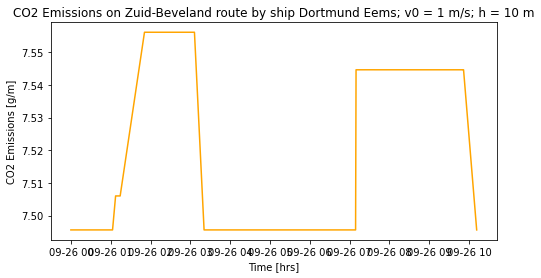

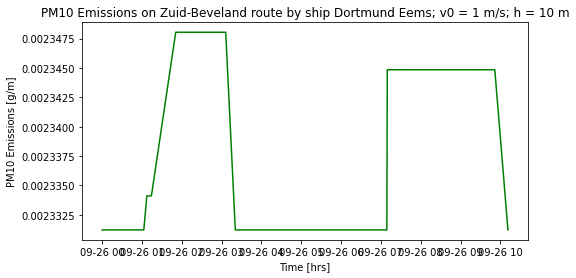

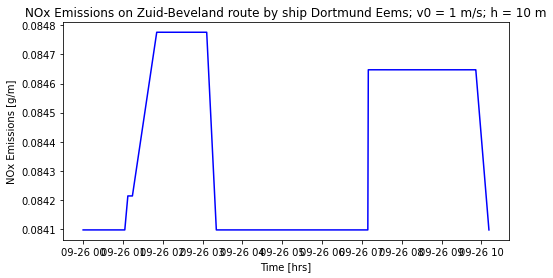

In [49]:
print(df.keys())
#time = (df['time_stop'] - df['time_start']) / 3600
#x = df['delta_t'].cumsum()
x = df['time_start']
y1 = df['CO2_g_m']
y2 = df['PM10_g_m']
y3 = df['NOX_g_m']

plt.figure(figsize=(8,4))
plt.plot(x,y1, color = 'orange')
plt.xlabel('Time [hrs]')
plt.ylabel('CO2 Emissions [g/m]')
plt.title('CO2 Emissions on Zuid-Beveland route by ship Dortmund Eems; v0 = 1 m/s; h = 10 m')

plt.figure(figsize=(8,4))
plt.plot(x,y2, color = 'green')
plt.xlabel('Time [hrs]')
plt.ylabel('PM10 Emissions [g/m]')
plt.title('PM10 Emissions on Zuid-Beveland route by ship Dortmund Eems; v0 = 1 m/s; h = 10 m')

plt.figure(figsize=(8,4))
plt.plot(x,y3, color = 'blue')
plt.xlabel('Time [hrs]')
plt.ylabel('NOx Emissions [g/m]')
plt.title('NOx Emissions on Zuid-Beveland route by ship Dortmund Eems; v0 = 1 m/s; h = 10 m')

Index(['time_start', 'time_stop', 'edge_start', 'edge_stop', 'P_tot',
       'P_installed', 'total_energy', 'total_fuel_consumption',
       'total_emission_CO2', 'total_emission_PM10', 'total_emission_NOX',
       'stationary', 'water depth', 'distance', 'delta_t', 'CO2_g_m',
       'PM10_g_m', 'NOX_g_m'],
      dtype='object')


Text(0.5, 1.0, 'NOx Emissions on Zuid-Beveland route by ship Dortmund Eems; v0 = 1 m/s; h = 10 m')

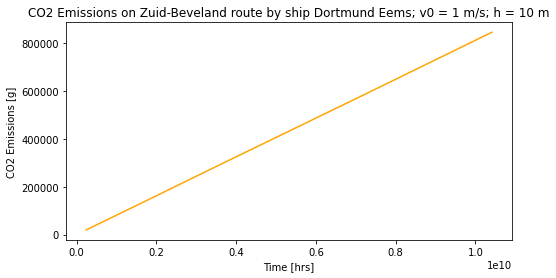

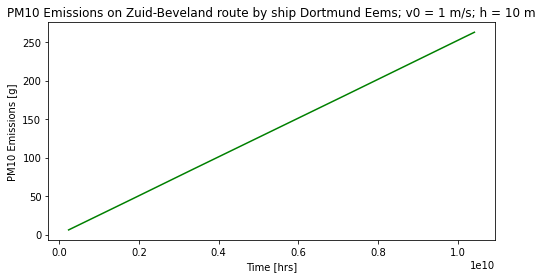

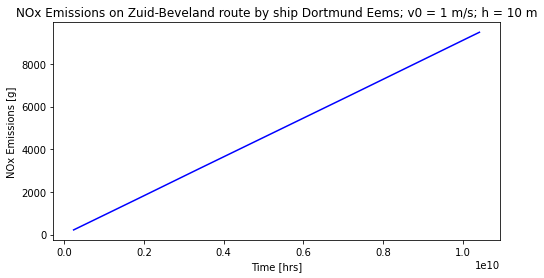

In [50]:
print(df.keys())
time = (df['time_stop'] - df['time_start']) / 3600
x = time.cumsum()
y1 = df['total_emission_CO2'].cumsum()
y2 = df['total_emission_PM10'].cumsum()
y3 = df['total_emission_NOX'].cumsum()

plt.figure(figsize=(8,4))
plt.plot(x,y1, color = 'orange')
plt.xlabel('Time [hrs]')
plt.ylabel('CO2 Emissions [g]')
plt.title('CO2 Emissions on Zuid-Beveland route by ship Dortmund Eems; v0 = 1 m/s; h = 10 m')

plt.figure(figsize=(8,4))
plt.plot(x,y2, color = 'green')
plt.xlabel('Time [hrs]')
plt.ylabel('PM10 Emissions [g]')
plt.title('PM10 Emissions on Zuid-Beveland route by ship Dortmund Eems; v0 = 1 m/s; h = 10 m')

plt.figure(figsize=(8,4))
plt.plot(x,y3, color = 'blue')
plt.xlabel('Time [hrs]')
plt.ylabel('NOx Emissions [g]')
plt.title('NOx Emissions on Zuid-Beveland route by ship Dortmund Eems; v0 = 1 m/s; h = 10 m')

In [51]:
np.sum(df['total_energy'])

1183.120408452934

In [52]:
# plot route used for the energy calculation
plt.figure(figsize = (12,12))
energycalculation.plot()

/Users/baart_f/.virtualenvs/opentnsim/lib/python3.9/site-packages/pandas/core/dtypes/cast.py:122: ShapelyDeprecationWarning:

The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.



<Figure size 864x864 with 0 Axes>

### 8. Visualise on Google Earth

In [53]:
opentnsim.plot.vessel_kml(env, [vessel], fname='vessel_movements.kml')

### To do's

- Align vessel database information with the information in the code
- Delete all information you don't use from the vessel_db